In [5]:
from matplotlib import pyplot as plt
import os
import numpy as np
from simulation_similarity_analysis.dataset_processing import IMG_TYPES, TIMESTEPS, DatasetProcessing
import glob
import re
plt.rcParams['text.usetex'] = True

In [6]:
dataset = DatasetProcessing("full_no_dose_dataset_start=350_interval=100_ndraw=8_size=(64,64)", jupyter=True)
parameters = {
    "cell_cycle":"Duration of the cell cycle $t_{total}$",
    "average_healthy_glucose_absorption":"Average healthy glucose absorption $\mu_{g\_healthy}$",
    "average_cancer_glucose_absorption":"Average cancer glucose absorption $\mu_{g\_cancer}$",
    "average_healthy_oxygen_consumption":"Average healthy oxygen consumption $\mu_{o\_healthy}$",
    "average_cancer_oxygen_consumption":"Average cancer oxygen consumption $\mu_{o\_cancer}$"
             }


# Principal Component Analysis (PCA)
## All variation

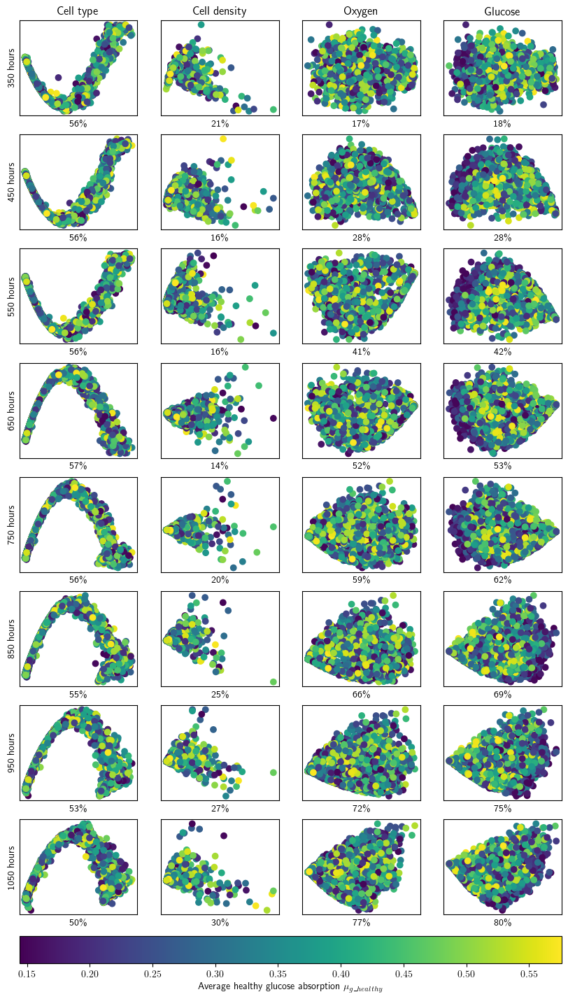

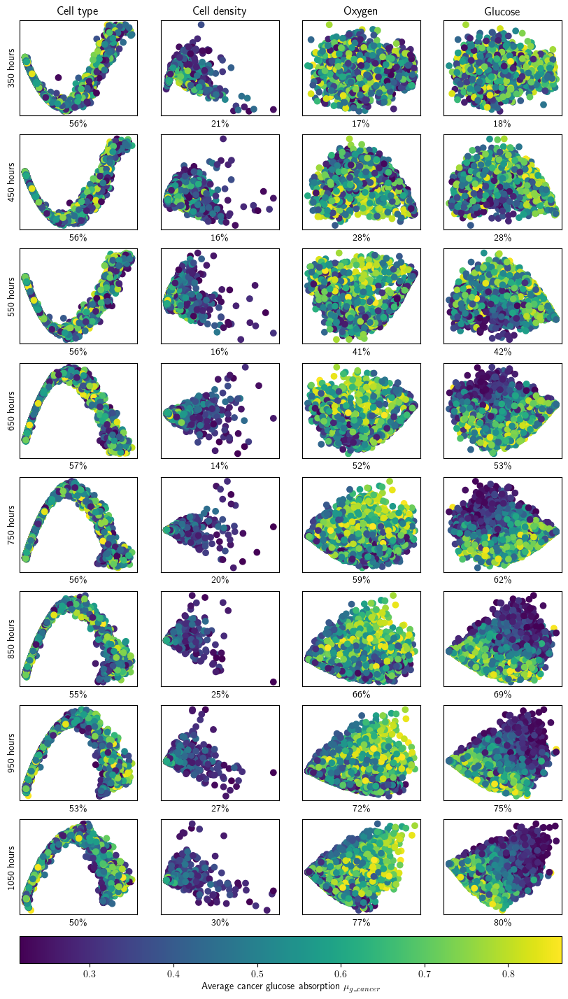

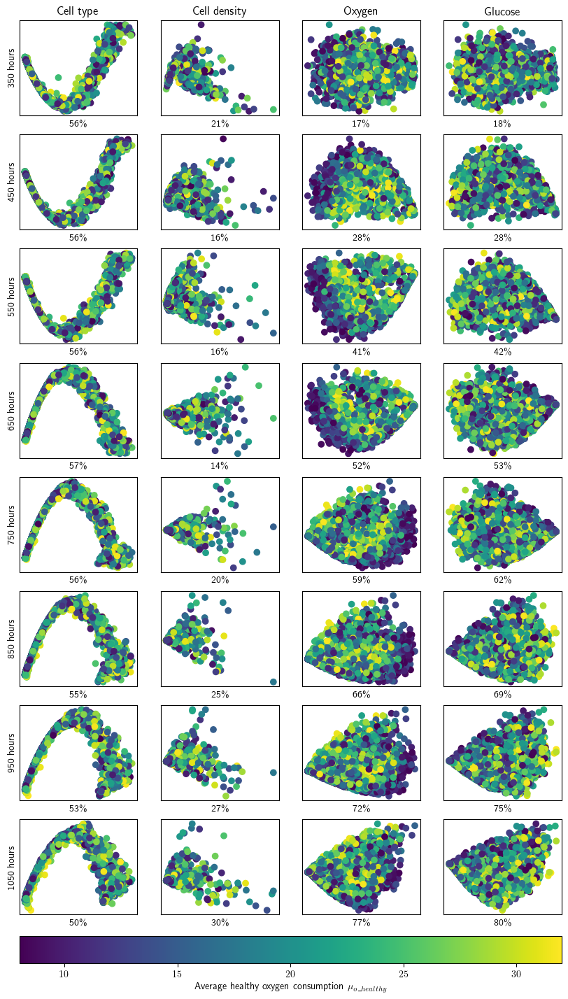

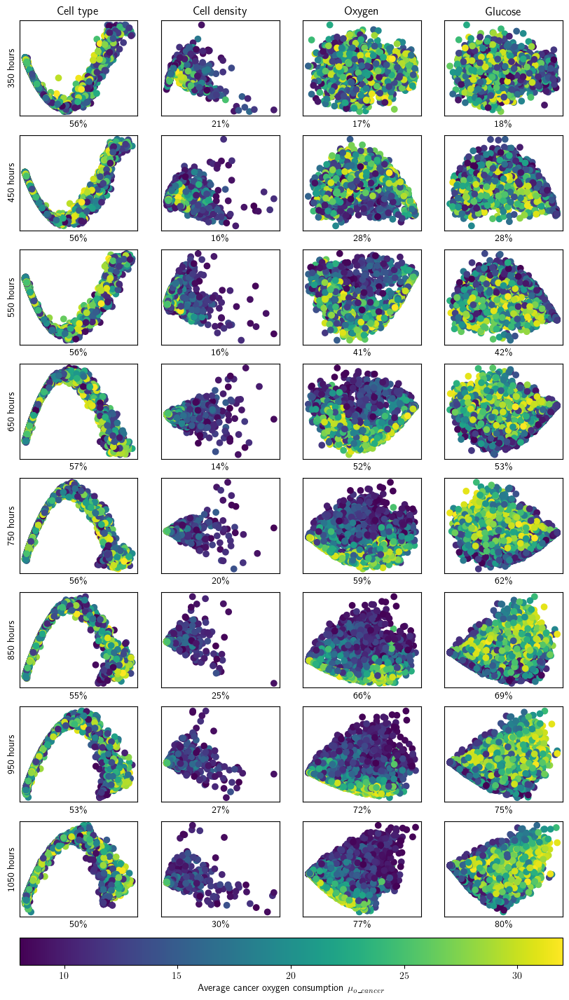

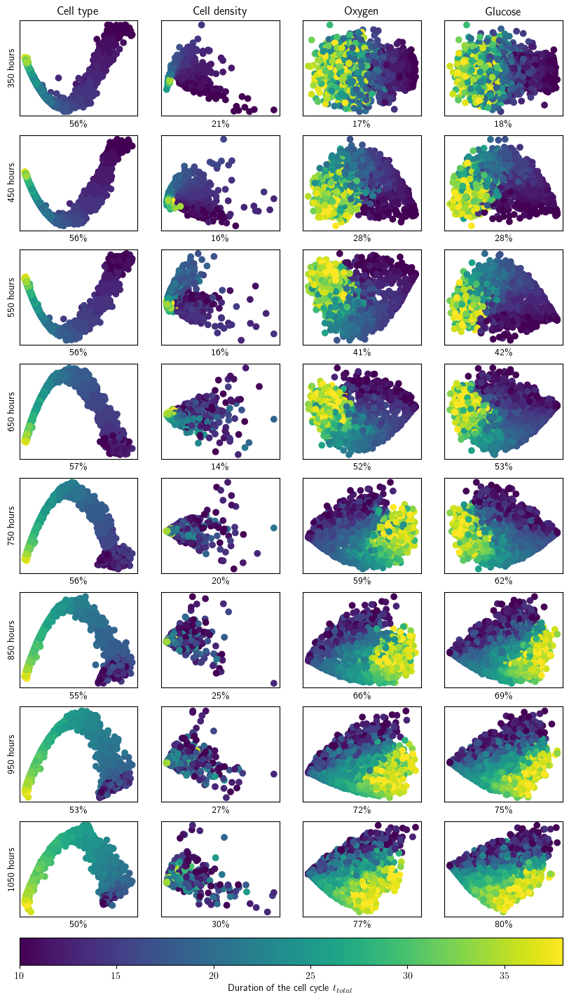

In [3]:
im=None
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            file_start = os.path.join("pca",f'pca_{image_type}_{draw}_vr*')
            matching_files = glob.glob(file_start)[0]
            explained_variance = float(matching_files.split('=')[1][:-4])
            pca_data = np.load(matching_files)
            im = ax[i,j].scatter(pca_data[:,0],pca_data[:,1], c=target)
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            
            ax[i,j].set_xlabel(f"{int(explained_variance*100)}\%")
            
            
                
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(f"{row} hours")
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.02, label=f"{parameters[param]}")
    plt.savefig(os.path.join("pca", f'all_pca_{param}.pdf'),bbox_inches='tight')


## Combined PCA

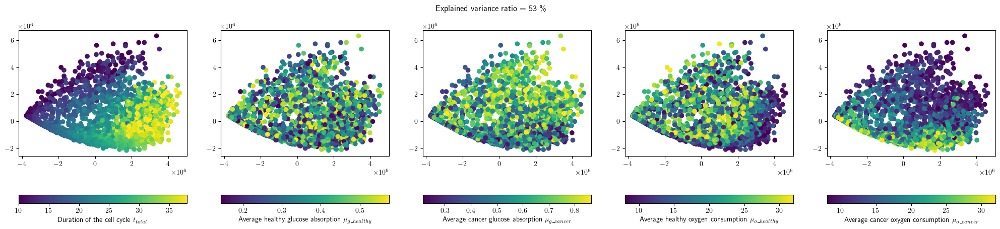

In [6]:
data = list()
draws = range(350,1150,100)

file_start = os.path.join("pca",f'pca_combined_vr*')
matching_files = glob.glob(file_start)[0]
explained_variance = float(matching_files.split('=')[1][:-4])
pca_data = np.load(matching_files)

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(parameters.keys()):
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    im = ax[i].scatter(pca_data[:,0],pca_data[:,1], c=target)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.2, label=f"{parameters[param]}")
fig.suptitle(f"Explained variance ratio = {int(explained_variance*100)} \%")
plt.savefig(os.path.join("pca", f'all_pca_combined.pdf'),bbox_inches='tight')

# Isomap
## All variation

In [ ]:
im=None
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            isomap_data = np.load(os.path.join("isomap",f"isomap_{image_type}_{draw}.npy"))
            im = ax[i,j].scatter(isomap_data[:,0],isomap_data[:,1], c=target)
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
            
            
                
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(f"{row} hours")
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.02, label=f"{parameters[param]}")
    plt.savefig(os.path.join("isomap", f'all_isomap_{param}.pdf'),bbox_inches='tight')


## Combined PCA

In [ ]:
data = list()
draws = range(350,1150,100)

isomap_data = np.load(os.path.join("isomap",f"isomap_combined.npy"))

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(parameters.keys()):
    target = [dataset.get_sample_param(i)[param] for i in range(len(dataset))]
    im = ax[i].scatter(isomap_data[:,0],isomap_data[:,1], c=target)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.2, label=f"{parameters[param]}")
plt.savefig(os.path.join("isomap", f'all_isomap_combined.pdf'),bbox_inches='tight')

# Mutual information

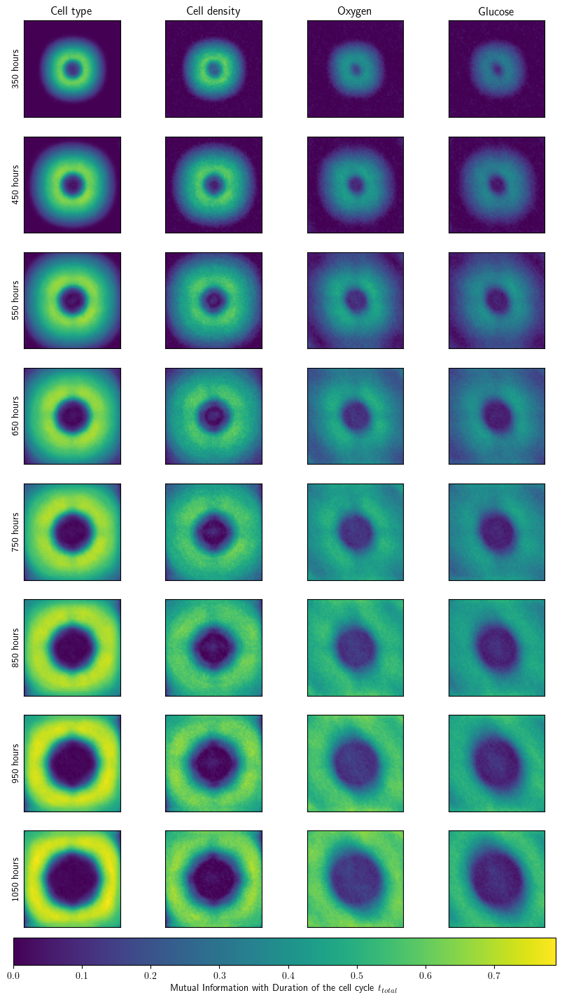

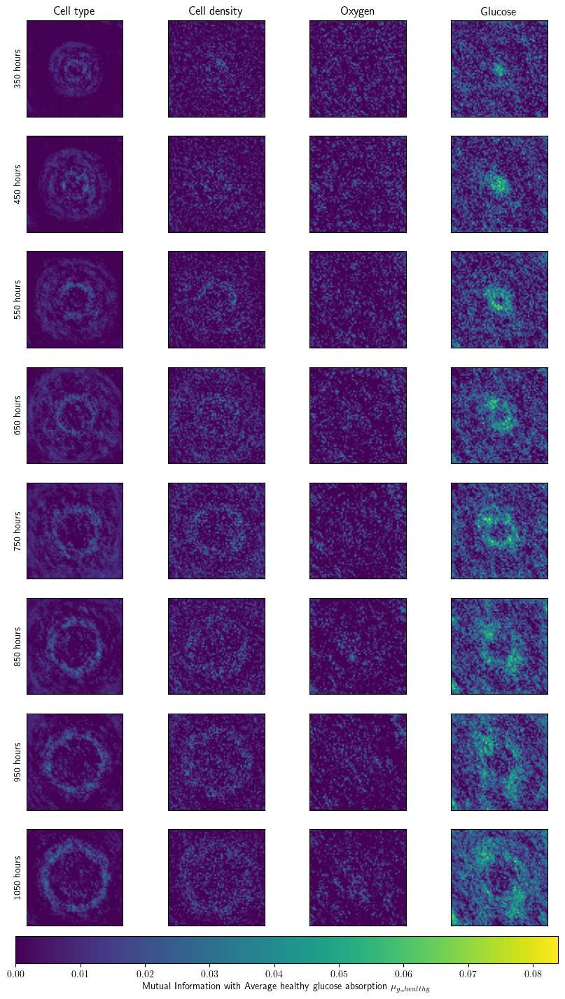

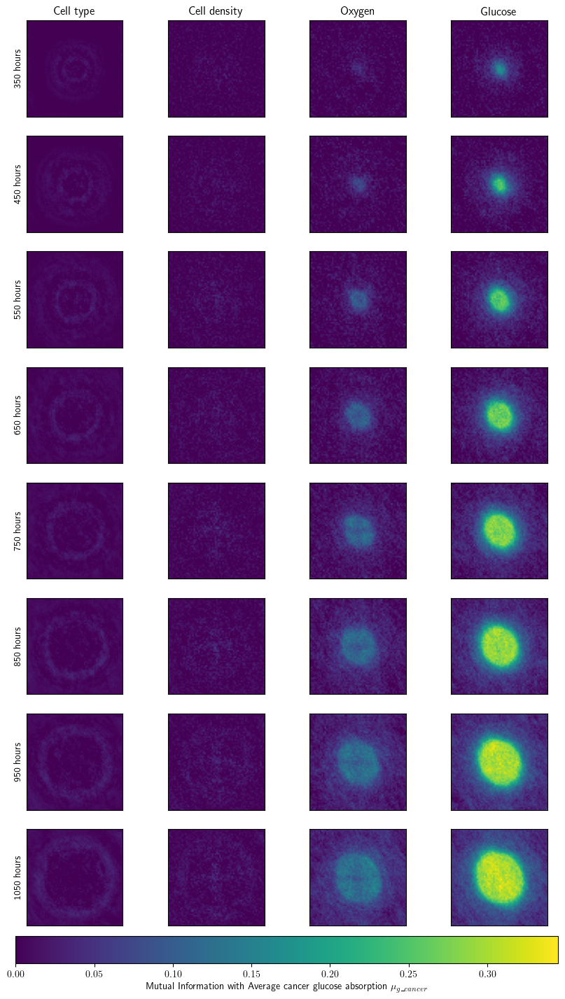

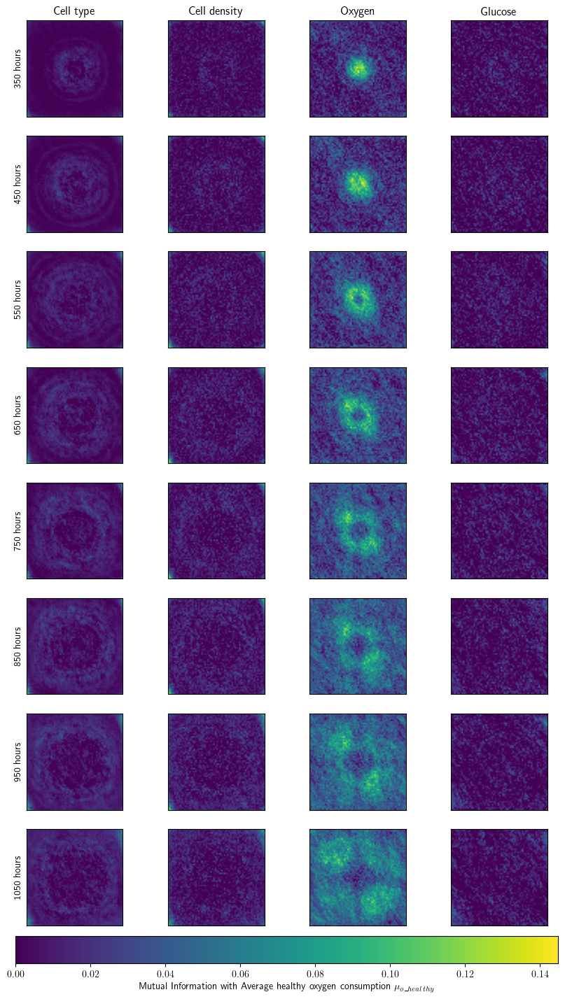

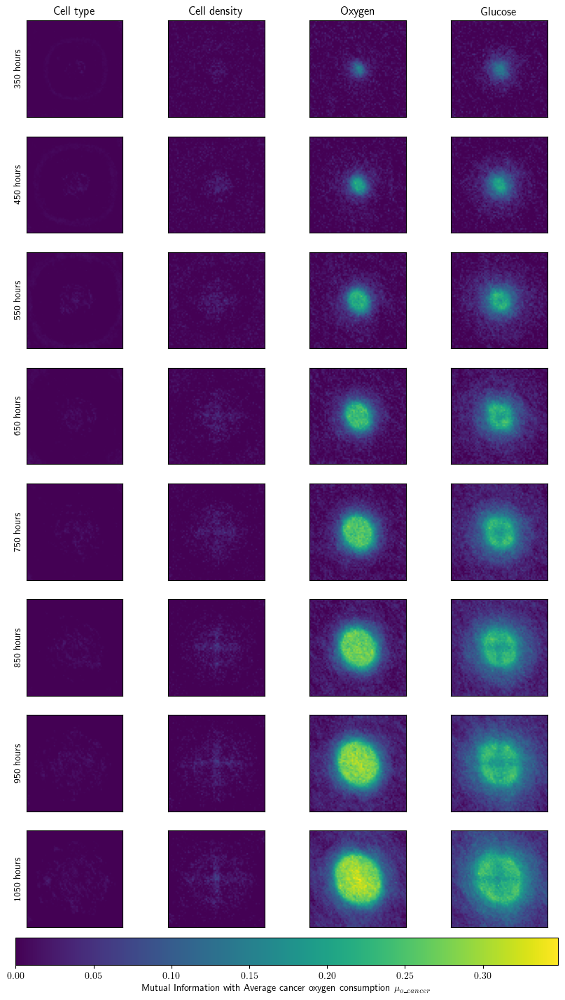

In [7]:
os.makedirs("mi", exist_ok=True)
for param in parameters.keys():
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    im = None
    mutual_information = {}
    v_min = np.inf
    v_max = -np.inf
    for i, draw in enumerate(TIMESTEPS):
        mutual_information[draw] = dict()
        for j, image_type in enumerate(IMG_TYPES):
            mutual_information[draw][image_type] = np.load(os.path.join("mi",f'mi_{draw}_{image_type}_{param}.npy'))
            v_min = min(v_min, mutual_information[draw][image_type].min())
            v_max = max(v_max, mutual_information[draw][image_type].max())
    for i, draw in enumerate(TIMESTEPS):
        for j, image_type in enumerate(IMG_TYPES):
            im = ax[i,j].imshow(mutual_information[draw][image_type], vmin=v_min, vmax=v_max)
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
    for axes, col in zip(ax[0], ["Cell type","Cell density","Oxygen","Glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], TIMESTEPS):
        axes.set_ylabel(f"{row} hours")
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01, label = f"Mutual Information with {parameters[param]}")
    plt.savefig(os.path.join("mi", f'all_mutual_information_{param}.pdf'),bbox_inches='tight', dpi=400)
